# COVID-Confirmed Cases clustering with TIMEX CLUSTERING
In this notebook we will see how to use TIMEX CLUSTERING to automatically create the clusters for the time series in each country of confirmed cases per day during the COVID pandemic, by using k-means algorithm and different distance measures: ED, DWT and soft-DWT.

Now, this is just to show the capabilities of TIMEX CLUSTERING and to give an example of code employing TIMEX CLUSTERING. Different clustering approaches will be use, characteristic that TIMEX CLUSTERING has and that is a great advantage in order to find the best clustering model.

In this notebook we will use the data from the the webpage (https://ourworldindata.org/coronavirus#coronavirus-country-profiles), which has the number of new cases per day for each country. TIMEX CLUSTERING will be use without the knowledge of the number of clusters that contained the data, by performing the clustering TIMEX CLUSTERING automatically will find the best number of clusters that grouped the data. Some changes were made to the downloaded CSV:
- only 193 countries Member states of the United Nations were considered, from those countries only the ones with at least half of the data in the time period were considered, finishing with 181 countries;
- it was taken the length of the timeseries starting from 24/02/2020 until 20/02/2022.

The data looks like this, before being re-ordered in crescent orded:

![overview](https://github.com/uGR17/TIMEX_CLUSTERING/blob/main/examples/figures/WorldCovid/k_means_covid_case.PNG?raw=1)



We will focus on all the columns (181 time series countries): `date`,  contain the time-stamps of the time-series, and `country`, which is the name of the country time series and each column contained the confirmed cases of each day.

We will see how to automatize all the ingestion and clustering tasks.

## TIMEX CLUSTERING Configuration Dictionary
The most important aspects of TIMEX CLUSTERING can be configured with a simple Python dictionary (or, if you prefer, a JSON file which can be loaded at runtime).

For this task, we could use a dictionary similar to this:

In [ ]:
param_config_covid = {
  "activity_title": "COVID-19 clustering with TIMEX CLUSTERING framework",
  "verbose": "INFO",
  "input_parameters": {
    "source_data_url": "https://raw.githubusercontent.com/uGR17/TIMEX_CLUSTERING/main/examples/datasets/World_Covid_Dataset.csv",
    #"columns_to_load_from_url": "date,ts1,ts2,ts3,ts4",  # Load all the columns from the dataset
    "index_column_name": "date",  # Use this column as index
    "frequency": "D",  # Data has a daily frequency; TIMEX can infer it, but if it is known it can be defined.
    #"timeseries_names":{ # Dictionary of key-values (old_name: new_name) used to rename some columns in the CSV
    #  "date": "Date",
    #  "Italy": "italia",
    #  "Spain": "spagna",
    #}
  },
  "model_parameters": {
     "clustering_approach": "observation_based,feature_based,model_based",  # Clustering approach which will be tested.  
     "models": "k_means,gaussian_mixture",  # Model(s) which will be tested. 
     "pre_transformation": "log_modified",  # Only one data preprocesing transformation to test, for Feature Based clustering approach, i.e.: none,log or log_modified
     "distance_metric": "euclidean,dtw",  # softdtw Distance/similarity measure which will be tested, i.e.: euclidean,dtw,softdtw
     "feature_transformations": "DWT",  # Feature transformations to test, fonly for the Feature Based clustering approach, i.e.: DWT,DFT
     "n_clusters": [3, 4, 5],  # List of number of clusters settings to search, for the non-hierarchical clustering models.
     "gamma": 0.01,  # Regularization parameter for the soft DWT metric, lower is less smoothed (closer to true DTW).
     "main_accuracy_estimator": "silhouette"  # Use the Silhouette score as main metric to measure accuracy.
  },
  "visualization_parameters": {
    "xcorr_graph_threshold": 0.8,
  }
}

## Launch TIMEX CLUSTERING!
Launching TIMEX CLUSTERING is as simple as running few lines of code. Note that this may require a minute or two to be installed...

In [ ]:
pip install timexseries_clustering

     |████████████████████████████████| 58 kB 1.5 MB/s 
     |████████████████████████████████| 1.4 MB 15.5 MB/s 
     |████████████████████████████████| 209 kB 32.8 MB/s 
     |████████████████████████████████| 79 kB 823 kB/s 
     |████████████████████████████████| 1.1 MB 36.9 MB/s 
     |████████████████████████████████| 9.5 MB 20.2 MB/s 
     |████████████████████████████████| 38.1 MB 46.0 MB/s 
     |████████████████████████████████| 288 kB 45.7 MB/s 
     |████████████████████████████████| 296 kB 45.5 MB/s 
     |████████████████████████████████| 793 kB 44.1 MB/s 
     |████████████████████████████████| 3.7 MB 31.6 MB/s 
     |████████████████████████████████| 83 kB 1.6 MB/s 
     |████████████████████████████████| 1.8 MB 33.6 MB/s 
     |████████████████████████████████| 209 kB 46.4 MB/s 
     |████████████████████████████████| 209 kB 51.7 MB/s 
     |████████████████████████████████| 207 kB 47.0 MB/s 
     |████████████████████████████████| 197 kB 44.4 MB/s 
     |█████████████

In [ ]:
import logging
import sys
logging.basicConfig(level=logging.INFO, stream=sys.stdout)
logger = logging.getLogger(__name__)

from timexseries_clustering.data_ingestion import ingest_timeseries
from timexseries_clustering.data_clustering.pipeline import create_timeseries_containers

import tensorflow as tf

with tf.device('/device:GPU:0'):
  ingested_dataset_covid = ingest_timeseries(param_config_covid)

INFO:timexseries_clustering.data_ingestion:Starting the data ingestion phase.
INFO:timexseries_clustering.data_ingestion:Finished the data-ingestion phase. Some stats:
-> Number of rows: 728
-> Number of columns: 181
-> Column names: ['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde', 'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 

In [ ]:
display(ingested_dataset_covid.tail(5))

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Kingdom,United States,Uruguay,Uzbekistan,Vatican,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
date,,,,,,,,,,,,,,,,,,,,,
2022-02-16,97,449,424,91,13,53,17034,1774,20635,38256,...,54091,115253,6640,296,0,1065,34737,8,285,610
2022-02-17,154,361,375,70,17,11,16650,1723,22729,30914,...,51725,101335,5517,241,0,926,36200,11,319,385
2022-02-18,184,300,316,67,20,5,15389,1417,23217,31166,...,47481,147827,7179,272,0,979,42439,13,290,432
2022-02-19,74,303,251,64,12,8,7807,1469,17376,25147,...,34011,33556,4355,191,0,606,54830,10,252,194
2022-02-20,274,260,118,64,21,11,4450,700,18219,48357,...,25536,22053,3337,204,0,833,47200,5,178,128


### COVID K_MEANS

Launch the clustering for all non-index column in the dataset, in this case 181 time series (countries). This take just a minute because. If will use data day by day, starting from the 2019-02-24, in order to get the best available clusters using the data available to that day.

In [ ]:
from timexseries_clustering.data_visualization.functions import timeseries_plot

ingested_dataset_plot = timeseries_plot(ingested_dataset_covid)
ingested_dataset_plot.figure

A TimeSeriesContainer is a container for all the time-series: it contains its raw data, models results, xcorr, etc. Let's inspect this object:
*   **Observation based**: 1hr 6min min with GPU, without softDTW for clusters: 3,4,5,6
*   **Feature based**: 26min min with GPU, without softDTW for clusters: 3,4,5,6
*   **Total time**: 1hr 32min min with GPU, without softDTW for clusters: 3,4,5,6

In [ ]:
import tensorflow as tf
#20,017s
with tf.device('/device:GPU:0'):
  timeseries_containers = create_timeseries_containers(ingested_dataset_covid, param_config_covid)

INFO:timexseries_clustering.data_clustering.pipeline:Using approach: feature_based and using model k_means...
INFO:timexseries_clustering.data_clustering.pipeline:Computing univariate clustering using approach: feature_based, number of clusters: 3, distance metric: euclidean and transformation: DWT...
INFO:timexseries_clustering.data_clustering.pipeline:Computing univariate clustering using approach: feature_based, number of clusters: 4, distance metric: euclidean and transformation: DWT...
INFO:timexseries_clustering.data_clustering.pipeline:Computing univariate clustering using approach: feature_based, number of clusters: 5, distance metric: euclidean and transformation: DWT...
INFO:timexseries_clustering.data_clustering.pipeline:For the metric: euclidean the best clustering is obtained using 3 number of clusters and transfomation DWT.
INFO:timexseries_clustering.data_clustering.pipeline:Computing univariate clustering using approach: feature_based, number of clusters: 3, distance me

The first attribute of the container is the `timeseries_data`. This contains the data only relative to the container time-series:

In [ ]:
timeseries_data = timeseries_containers[0].timeseries_data
display(timeseries_data.head(5))

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Kingdom,United States,Uruguay,Uzbekistan,Vatican,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
date,,,,,,,,,,,,,,,,,,,,,
2020-02-24,5,0,0,0,0,0,0,0,0,0,...,2,0,0,0,0,0,0,0,0,0
2020-02-25,0,0,1,0,0,0,0,0,0,2,...,4,0,0,0,0,0,0,0,0,0
2020-02-26,0,0,0,0,0,0,0,0,0,0,...,3,0,0,0,0,0,0,0,0,0
2020-02-27,0,0,0,0,0,0,0,0,0,1,...,7,1,0,0,0,0,0,0,0,0
2020-02-28,0,0,0,0,0,0,0,0,0,0,...,12,0,0,0,0,0,0,0,0,0


The second and fourth attribute are the `clustering_approach` and `best_model`. This contains the kind of clustering approach used, relative to the container time-series; as well as the characteristics of the best model found for that clustering approach. In TIMEX CLUSTERING can be used three different clustering appraoches: Observation based, Feature based or Model based clustering of time-series.

In [ ]:
clustering_approach = timeseries_containers[0].approach
print(type(clustering_approach))
print(clustering_approach)

best_model = timeseries_containers[0].best_model
small_dict_keys = ("clustering_approach","model","distance_metric","n_clusters","feature_transformation","pre_transformation") #To show only some of the information of the best_model
best_model_small = { key: best_model[key] for key in small_dict_keys}
print(type(best_model))
print(best_model_small)

<class 'str'>
Feature based
<class 'dict'>
{'clustering_approach': 'feature_based', 'model': 'k_means', 'distance_metric': 'dtw', 'n_clusters': 3, 'feature_transformation': 'DWT', 'pre_transformation': 'log_modified'}


The third attribute is `models`. This is a dictionary which contains an entry for each employed model (in this case only `k_means`) with its corresponding distance/similarity metric. For each model and metric, in a ModelResult [ModelResult](https://github.com/uGR17/TIMEX_CLUSTERING/blob/main/timexseries_clustering/data_clustering/models/predictor.py#L38) object the results and information of the clustering are contained, in this object it can be found i.e. a numpy array object, defining to which cluster belongs each time-series of the dataset and more information as it's shown in the following.


In [ ]:
timeseries_models_results = timeseries_containers[0].models
print(type(timeseries_models_results))
print(timeseries_models_results)

<class 'dict'>
{'k_means': {'euclidean': <timexseries_clustering.data_clustering.models.predictor.ModelResult object at 0x7efd3f903650>, 'dtw': <timexseries_clustering.data_clustering.models.predictor.ModelResult object at 0x7efc5c677490>}}


In [ ]:
kmeans_ED_model_results = timeseries_models_results['k_means']['euclidean']
print(kmeans_ED_model_results)

Each ModelResult has:
  - an array that contains the results of the **best clustering** for the **specified metric**, it contains the indexes of the cluster that each time series belongs to, which is automatically selected using the best model parameters (best number of clusters and transformation).
  - a list of [SingleResult](https://github.com/uGR17/TIMEX_CLUSTERING/blob/main/timexseries_clustering/data_clustering/models/predictor.py#L20) objects, each one c]
  - a dictionary containing **information of the best model**, apporach, model, metric, best number of cluster, best transformation.
  - a DataFrame, containing the **cluster centers** of each cluster obtained using the best model parameters.


Let's inspect them:

In [ ]:
best_clustering = kmeans_ED_model_results.best_clustering
print(type(best_clustering))
print(best_clustering)

<class 'numpy.ndarray'>
[2 2 2 1 1 1 0 2 2 2 2 1 2 0 1 2 0 1 1 1 2 2 2 0 1 2 1 1 1 1 0 1 1 1 0 1 0
 1 1 2 1 2 2 2 0 1 2 1 1 2 2 2 2 1 1 2 1 2 2 2 0 1 1 2 0 2 2 1 2 1 1 1 1 2
 1 2 1 0 0 0 0 2 2 0 2 0 2 2 2 2 2 1 2 2 1 1 2 1 2 2 1 1 2 2 1 1 1 1 0 2 1
 2 2 2 2 2 2 0 1 1 2 2 2 2 0 2 1 2 0 0 0 0 2 0 0 1 1 1 1 1 1 2 1 2 1 1 2 2
 2 1 0 2 1 0 2 1 1 0 0 1 1 1 2 1 1 1 2 0 2 0 2 0 0 2 2 1 2 2 1 2 2]


In [ ]:
kmeans_ED_results = kmeans_ED_model_results.results
print(type(kmeans_ED_results))
print(kmeans_ED_results)

<class 'list'>
[<timexseries_clustering.data_clustering.models.predictor.SingleResult object at 0x7efc5cdd8c90>, <timexseries_clustering.data_clustering.models.predictor.SingleResult object at 0x7efc5cdeb9d0>, <timexseries_clustering.data_clustering.models.predictor.SingleResult object at 0x7efc5cc7a9d0>]


Each SingleResult contains the **characteristics** and **performances** obtained using different number of clusters and transformation

In [ ]:
print('First element(SingleResult) of the list:')
print(kmeans_ED_results[0].characteristics)
print(kmeans_ED_results[0].performances.get_dict())
print('Second element(SingleResult) of the list:')
print(kmeans_ED_results[1].characteristics)
print(kmeans_ED_results[1].performances.get_dict())

First element(SingleResult) of the list:
{'clustering_approach': 'Feature based', 'model': 'K Means', 'distance_metric': 'Euclidean', 'n_clusters': 3, 'feature_transformation': 'DWT', 'pre_transformation': 'log_modified'}
{'silhouette': 0.3031784052743818, 'davies_bouldin': 1.107119464161089, 'calinski_harabasz': 150.27563105275888}
Second element(SingleResult) of the list:
{'clustering_approach': 'Feature based', 'model': 'K Means', 'distance_metric': 'Euclidean', 'n_clusters': 4, 'feature_transformation': 'DWT', 'pre_transformation': 'log_modified'}
{'silhouette': 0.2535641578470344, 'davies_bouldin': 1.4822282653857597, 'calinski_harabasz': 114.62871468555667}


**Characteristics** and **cluster_centers** of the **best clustering** for the model and metric specified. 

In [ ]:
kmeans_ED_characts = kmeans_ED_model_results.characteristics
print(kmeans_ED_characts)

{'clustering_approach': 'Feature based', 'model': 'K Means', 'distance_metric': 'Euclidean', 'n_clusters': 3, 'feature_transformation': 'DWT', 'pre_transformation': 'log_modified'}


In [ ]:
single_results = kmeans_ED_model_results.cluster_centers
print(type(single_results))
print(single_results.shape)
display(single_results.tail(5))

<class 'pandas.core.frame.DataFrame'>
(364, 3)


,0,1,2
2022-02-11,1.833641e+06,141.825328,41805.182590
2022-02-13,1.147761e+06,124.065339,33692.937854
2022-02-15,1.485676e+06,114.894968,39910.439812
2022-02-17,1.321394e+06,78.281071,39679.840944
2022-02-20,5.383118e+05,52.156128,29125.795061


We may plot this using TIMEX-CLUSTERING built-in visualization functions or use another plotting library of your preference using the objects prevoiusly obtained with TIMEX-CLUSTERING:

In [ ]:
from timexseries_clustering.data_visualization.functions import cluster_plot

clustering_plot = cluster_plot(timeseries_containers[0], timeseries_containers[0].models["k_means"])
clustering_plot.figure

In [ ]:
from timexseries_clustering.data_visualization.functions import cluster_plot

clustering_plot = cluster_plot(timeseries_containers[0], timeseries_containers[0].models["k_means"])
clustering_plot.figure

### Website creation

In this section we will see how to build a simple Dash application which shows, in a graphical way, all the results we obtained in this notebook.
Note that to run in the Notebook you need the Jupyter-Dash extension. Otherwise, simply copy the code and run it in a Python script (rembember to change "JupyterDash" to "Dash", when creating `app`!)

In [ ]:
# Imports
import dash
import dash_core_components as dcc
import dash_html_components as html
import pandas as pd
import plotly.graph_objs as go
from timexseries_clustering.data_visualization.functions import create_timeseries_dash_children
from jupyter_dash import JupyterDash
from dash.dependencies import Input, Output

# Data visualization
children_for_each_timeseries = [{
    'name': s.approach,
    'children': create_timeseries_dash_children(s, param_config_covid)
} for s in timeseries_containers]  # This creates the Dash children, for each time-series in the dataset (in this case just one!)

# Initialize Dash app.
app = JupyterDash(__name__)
# app = dash.Dash(__name__) Use this outside of Jupyter!

disclaimer = [html.Div([
    html.H1("COVID-19 pandemic around the world: monitoring and clustering", style={'text-align': 'center'}),
    html.Hr(),
    html.Div([html.Img(src = 'https://raw.githubusercontent.com/uGR17/TIMEX_CLUSTERING/main/examples/figures/Politecnico-di-Milano.jpg', 
                       style = {'padding-top': '1%','height': '32%','width': '32%'})], style={'textAlign': 'center'}),
    html.H4(
        "Dashboard by the Intelligent Embedded Systems (IES) research group of the Politecnico di Milano, Italy",
        style={'text-align': 'center', 'top-margin': '25px'}),
    html.Hr(),
    dcc.Markdown('''
        Welcome to the monitoring and clustering dashboard of the Coronavirus (COVID-19) pandemic around the world. Provided by the Intelligent Embedded Systems (IES) research group of Politecnico di Milano, Italy.
        
        The dashboard relies on TIMEX CLUSTERING, a Python-based framework for automatic time series analysis developed by the IES research group.

        You can select the data to be visualized from the selector at the bottom of the page.

        For suggestions and questions contact:

        * Prof. Manuel Roveri - manuel.roveri@polimi.it
        
        * Ing. Alessandro Falcetta - alessandro.falcetta@polimi.it
        
        * Ing. Uriel Guadarrama - uriel.guadarrama@polimi.it
        '''),
    html.Br(),
    html.H2("Please select the clustering approach:")
    ], style={'width': '80%', 'margin': 'auto'}
    ), 
dcc.Dropdown(
    id='timeseries_selector',
    options=[{'label': i['name'], 'value': i['name']} for i in children_for_each_timeseries],
    value='Time-series'
), html.Div(id="timeseries_wrapper"), html.Div(dcc.Graph(), style={'display': 'none'})]

tree = html.Div(children=disclaimer, style={'width': '80%', 'margin': 'auto'})

app.layout = tree


@app.callback(
    Output(component_id='timeseries_wrapper', component_property='children'),
    [Input(component_id='timeseries_selector', component_property='value')]
)
def update_timeseries_wrapper(input_value):
    try:
        children = next(x['children'] for x in children_for_each_timeseries if x['name'] == input_value)
    except StopIteration:
        return html.Div(style={'padding': 200})

    return children

#app.run_server(port=10000)

# Run app and display result inline in the notebook
app.run_server(mode='external')#inline, external

<IPython.core.display.Javascript object>

## Comment on the results

There is an interesting comment to do on the performances of each clustering approahc. In the webpage, you will find the following plots, where you can select the clustering approach that you would like to analyze:

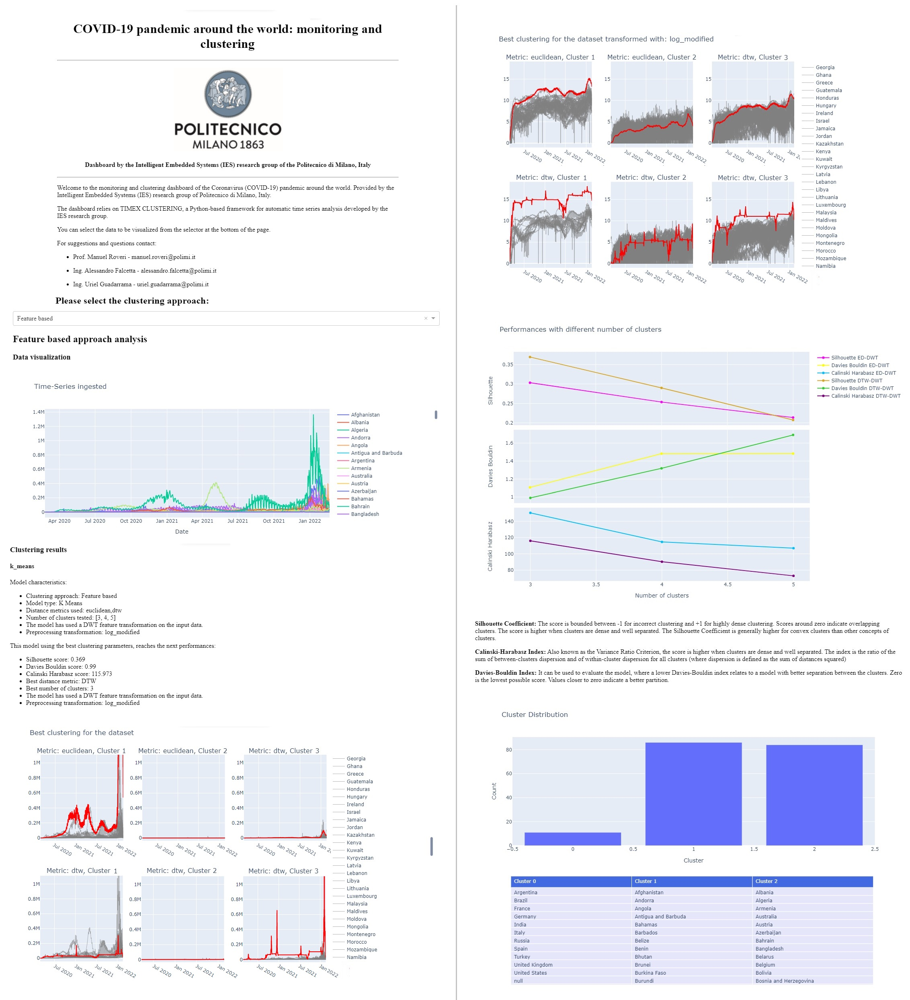

Looking closely at the Figure below, the first cluster (Cluster 1 graphs in the left side of the Figure) grouped the countries that faced different infection peaks through all the pandemic. In this cluster 11 countries can be found: Italy, France, Spain, United States, India, Germany, India, Russia, Turkey, United Kingdom, Argentina and Brazil. 

The second class (Cluster 2 graphs in the middle of the Figure) grouped the countries that better controlled the pandemic: in this cluster 86 countries can be found, examples of these countries are: China, New Zealand, Montenegro, Hong Kong, Congo, Iceland, so on and so forth. 

The third class (Cluster 3 graphs the right side of the) grouped the countries that also faced different infection peaks through all the pandemic, but that did not have an exponential growing in the new positive cases. Portugal for example, faced the biggest infection peak with the Omicron variant of the virus; however, in comparison with France (that belongs to the cluster 1), the new positive cases did not grow exponentially, sign that Portugal controlled to a greater extent this last peak of infections. In this last cluster 84 countries can be found, examples of these countries are: Portugal, Australia, Belgium, Egypt, Mexico, South Korea and many more; in this cluster also countries that controlled almost totally the positive cases through all the pandemic, but that were affected with an increase in the number of infections provoked by the Omicron variant of the virus can be found (e.g. South Korea).



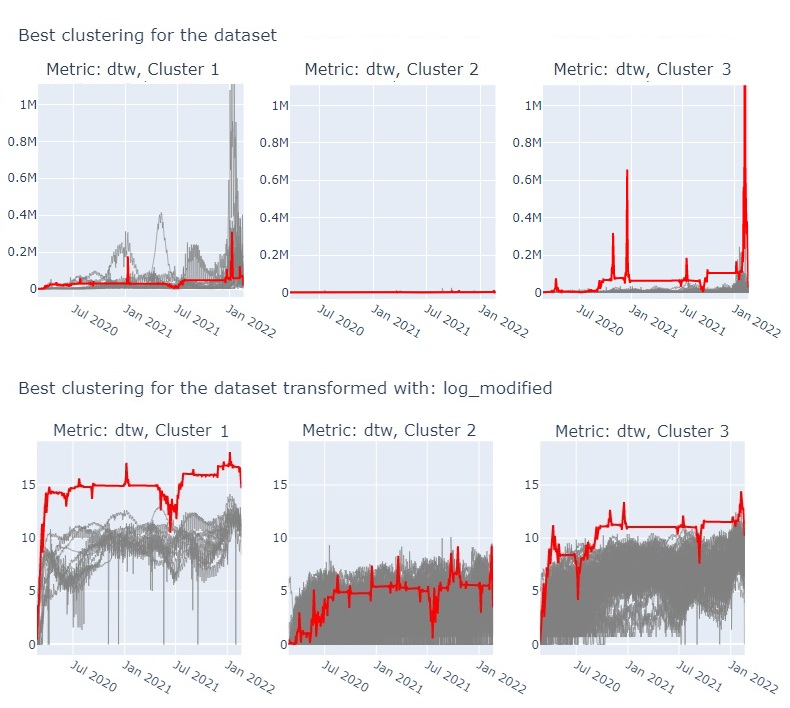

Finally, the quality of the best-performing model also can be corroborated with the cluster distribution plot, shown in Figure below, where it can be observed that the time-series are equally distributed to clusters.

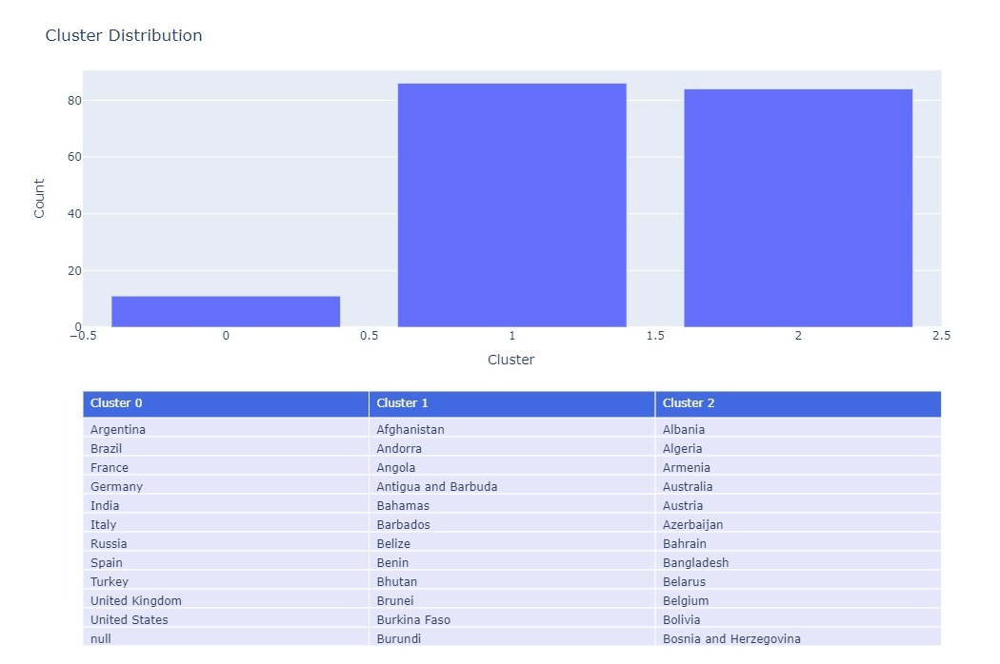